
## Image Processor Class from `hw3_q_1.py`

This notebook demonstrates the usage of the `ImageProcessor` class imported from the provided `hw3_q_1.py` file.


In [10]:
#!/usr/bin/env python3
import cv2
from hw3_q_1 import ImageProcessor

In [11]:

# Initialize the ImageProcessor class
processor = ImageProcessor()

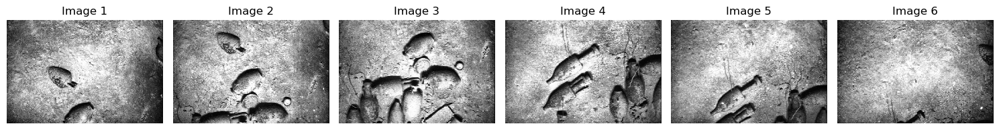

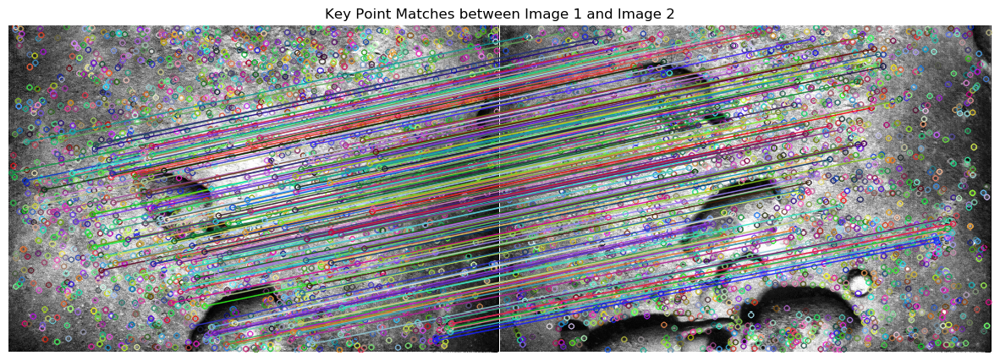

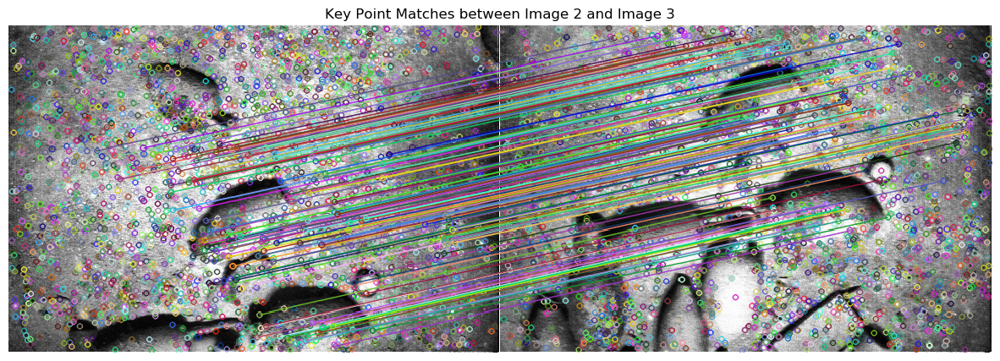

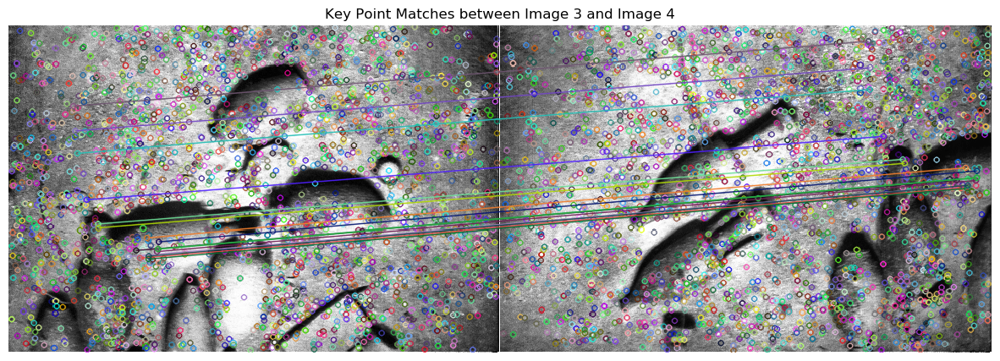

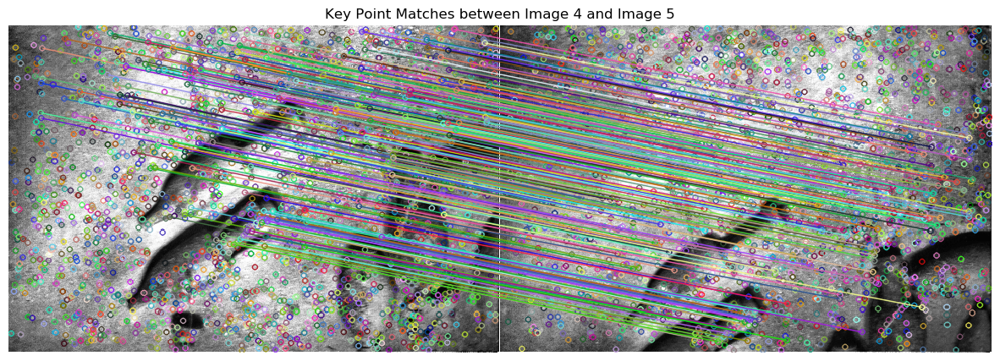

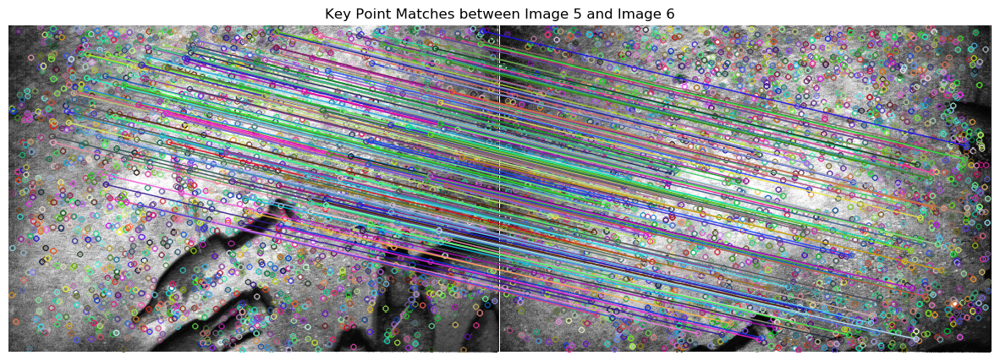

Homographies (Sequential): {'H_12': array([[ 9.72942571e-01, -3.75232247e-02,  1.58695691e+01],
       [ 1.47683831e-02,  9.65143663e-01, -1.23182919e+02],
       [-1.38382329e-05, -1.01541414e-04,  1.00000000e+00]]), 'H_23': array([[ 9.60413107e-01, -1.74015233e-02,  3.10380085e+01],
       [ 1.95725493e-02,  9.19886147e-01, -1.23169861e+02],
       [-1.76203332e-05, -8.96987412e-05,  1.00000000e+00]]), 'H_34': array([[ 5.25707279e+00, -6.85462289e-01,  2.52768830e+02],
       [ 9.76322459e-01,  1.14440505e+00, -1.53125532e+02],
       [ 6.47140858e-03, -1.34509842e-03,  1.00000000e+00]]), 'H_45': array([[ 1.00221454e+00,  3.60755250e-02, -1.39533054e+01],
       [-2.60999709e-02,  1.02282214e+00,  1.23654500e+02],
       [-1.10344334e-05,  1.05742715e-04,  1.00000000e+00]]), 'H_56': array([[ 9.99331144e-01,  5.26372751e-02, -1.35569505e+01],
       [-1.97438443e-02,  1.00974320e+00,  1.45592685e+02],
       [-1.55163241e-05,  1.69582174e-04,  1.00000000e+00]])}
Motions (Sequential): 

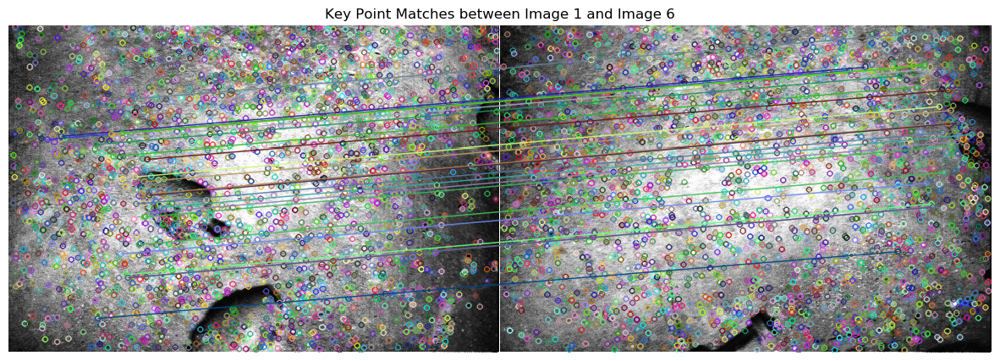

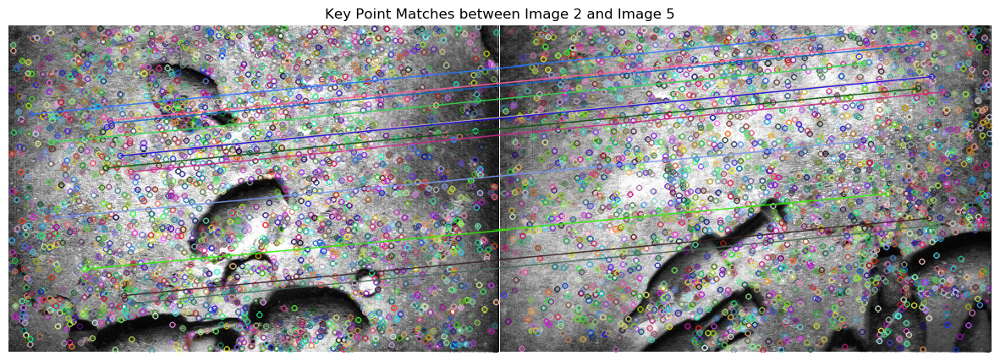

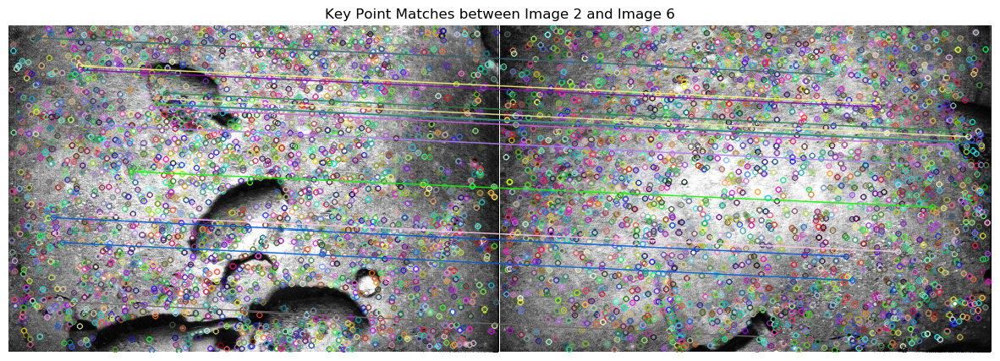

Homographies (Non-Sequential): {'H_16': array([[ 7.82542346e-01, -2.13021342e-01,  3.71705809e+02],
       [-1.41947554e-02,  7.97662121e-01, -5.72416626e+01],
       [-3.03411452e-04, -4.49611650e-04,  1.00000000e+00]]), 'H_25': array([[ 1.32434322e+00, -1.89183316e-01,  3.78252950e+02],
       [ 3.13515006e-02,  9.89739261e-01, -9.33508125e+01],
       [ 6.05923847e-04, -2.86055044e-04,  1.00000000e+00]]), 'H_26': array([[ 1.35151439e+00, -3.80269660e-02,  3.48742199e+02],
       [ 7.67307940e-02,  1.02364346e+00,  4.02348011e+01],
       [ 4.77412970e-04, -2.91240379e-05,  1.00000000e+00]])}
Motions (Non-Sequential): {'pose_16': {'x': -371.7058089343631, 'y': -57.241662609511934, 'theta': 0.1251655747502955}, 'pose_25': {'x': -378.25295026433974, 'y': -93.3508125489743, 'theta': 0.09501423454776758}, 'pose_26': {'x': -348.7421987027735, 'y': 40.234801085818496, 'theta': 0.048278301805403934}}
Motions: {'pose_12': {'x': -15.869569104128166, 'y': -123.18291856898425, 'theta': 0.026974

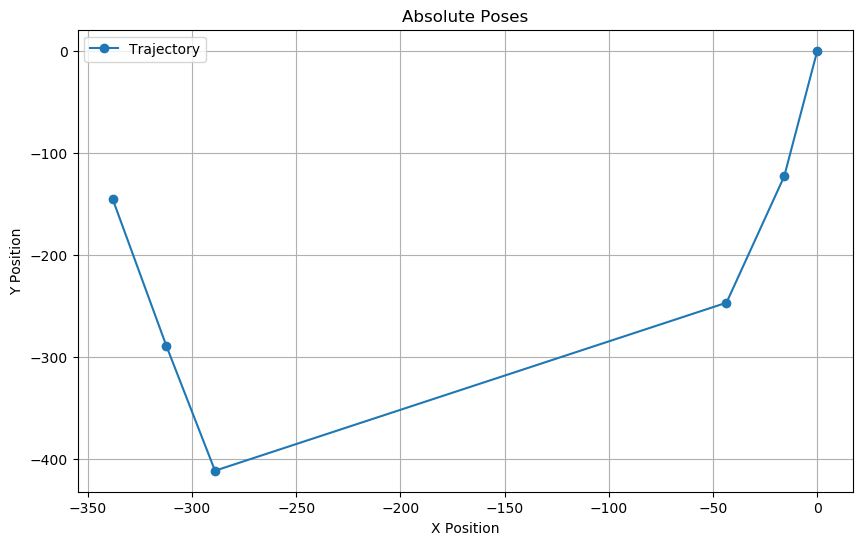

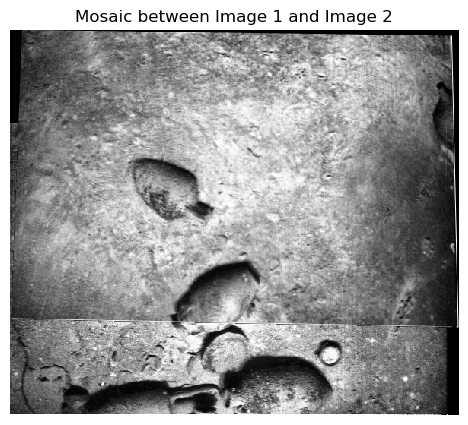

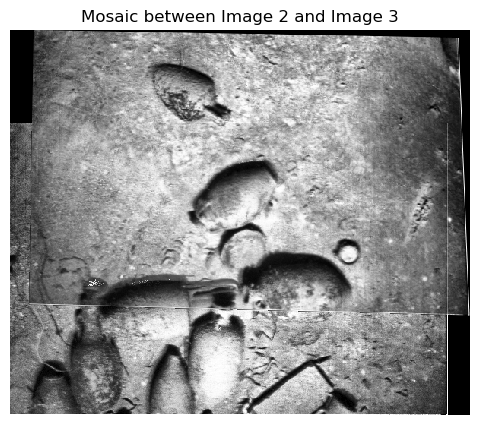

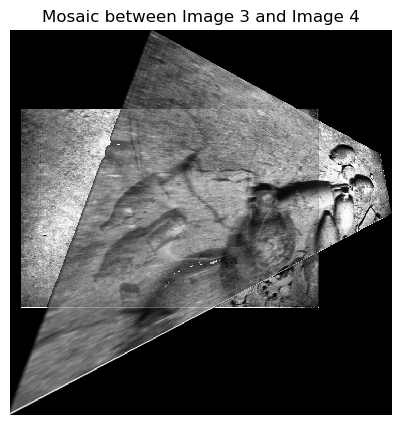

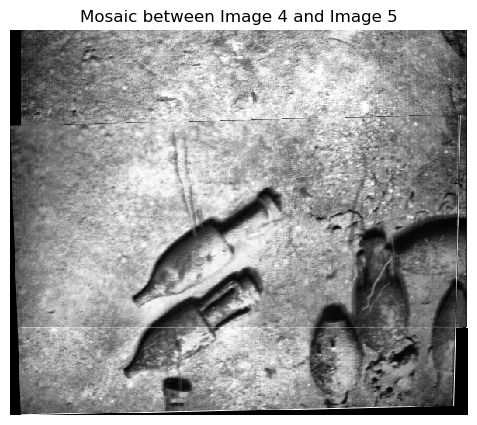

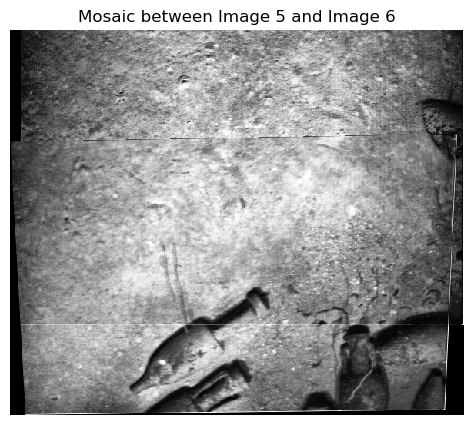

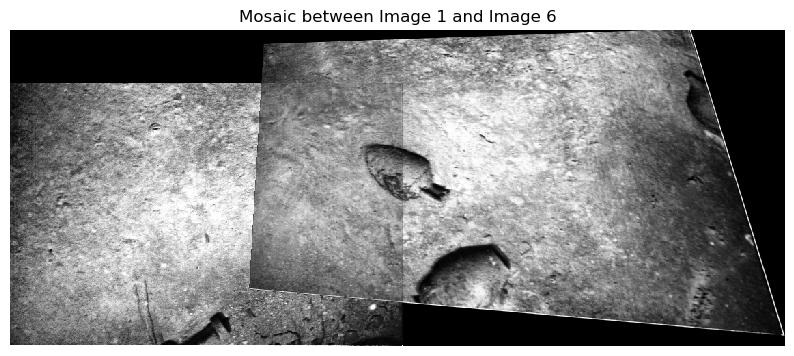

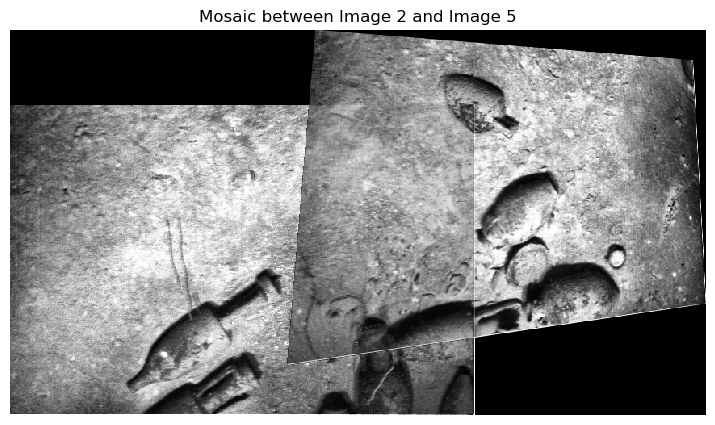

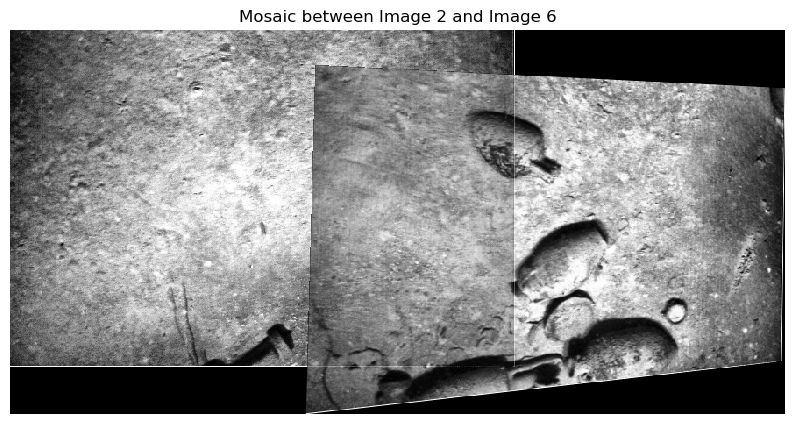

In [12]:

# Assuming the images are named 1.tif, 2.tif, ... and are located inside the 6Images directory
from matplotlib import pyplot as plt


images = [cv2.imread(f"/home/tides/Desktop/EECE7150/hw3/6Images/{i}.tif") for i in range(1, 7)]
if any(img is None for img in images):
    print("Error loading one or more images.")
else:
    # Initialize the processor
    processor = ImageProcessor()

    # Robust normalization of images (optional, only if required)
    images = [processor.robust_normalizer(img) for img in images]
    ImageProcessor.plot_images(images, titles=[f"Image {i+1}" for i in range(len(images))])

    # Process sequential image pairs
    homographies, motions = processor.process_image_pairs(images)
    print("Homographies (Sequential):", homographies)
    print("Motions (Sequential):", motions)

    # Process non-sequential image pairs
    pairs = [(1, 6), (2, 5), (2, 4), (3, 5), (1, 5), (2, 6)]
    non_sequential_homographies, non_sequential_motions = processor.process_image_pairs(images, pairs)
    print("Homographies (Non-Sequential):", non_sequential_homographies)
    print("Motions (Non-Sequential):", non_sequential_motions)

    # Compute absolute poses
    absolute_poses = processor.compute_absolute_poses(motions, images)
    print("Motions:", motions)
    print("Absolute Poses:", absolute_poses)
    ImageProcessor.plot_absolute_poses(absolute_poses)
    
    # Merge homographies and non_sequential_homographies into a single dictionary
    all_homographies = {**homographies, **non_sequential_homographies}

    # Iterate over all valid homography pairs (both sequential and non-sequential) and create mosaics
    for key, H in all_homographies.items():
        src_idx, dst_idx = int(key.split("_")[1][0]), int(key.split("_")[1][1])
        img1 = images[src_idx - 1]
        img2 = images[dst_idx - 1]

        if processor.is_valid_homography(H, [], inliers_threshold=0):  # setting inliers_threshold to 0 since we don't have inliers here
            mosaic, _ = processor.warpTwoImages(img1, img2, H)

            # Crop black borders
            gray = cv2.cvtColor(mosaic, cv2.COLOR_BGR2GRAY)
            _, thresh = cv2.threshold(gray, 1, 255, cv2.THRESH_BINARY)
            contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
            cnt = contours[0]
            x, y, w, h = cv2.boundingRect(cnt)
            crop = mosaic[y:y+h, x:x+w]

            # Display the mosaic using matplotlib
            plt.figure(figsize=(10,5))
            plt.imshow(cv2.cvtColor(crop, cv2.COLOR_BGR2RGB))
            plt.title(f"Mosaic between Image {src_idx} and Image {dst_idx}")
            plt.axis('off')
            plt.show()

